In [66]:
!git clone https://github.com/ashwathgupta/Track

fatal: destination path 'Track' already exists and is not an empty directory.


In [67]:
!ls Track

driving_log.csv  IMG


In [68]:
!pip3 install imgaug

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from tensorflow.keras.models import Sequential

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense

import cv2
import pandas as pd
import random
import os
import ntpath

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

import matplotlib.image as mpimg

from imgaug import augmenters as iaa


In [70]:
datadir='Track'
columns=['center','left', 'right', 'steering', 'throttle', 'reverse','speed']
data= pd.read_csv(os.path.join(datadir,'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth',None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\center_2024_09_14_17_44_24_535.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\left_2024_09_14_17_44_24_535.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\right_2024_09_14_17_44_24_535.jpg,0.0,0.0,0.0,0.000079
1,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\center_2024_09_14_17_44_24_637.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\left_2024_09_14_17_44_24_637.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\right_2024_09_14_17_44_24_637.jpg,0.0,0.0,0.0,0.000079
2,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\center_2024_09_14_17_44_24_739.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\left_2024_09_14_17_44_24_739.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\right_2024_09_14_17_44_24_739.jpg,0.0,0.0,0.0,0.000079
3,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\center_2024_09_14_17_44_24_839.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\left_2024_09_14_17_44_24_839.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\right_2024_09_14_17_44_24_839.jpg,0.0,0.0,0.0,0.000079
4,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\center_2024_09_14_17_44_24_941.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\left_2024_09_14_17_44_24_941.jpg,C:\Users\ashwa\Documents\Learn CS\ML\Autonomous car\Resources\Data\IMG\right_2024_09_14_17_44_24_941.jpg,0.0,0.0,0.0,0.000079


In [71]:
def path_leaf(path):

    head, tail=ntpath.split(path)
    return tail

data['center']=data['center'].apply(path_leaf)

data['left']=data['left'].apply(path_leaf)

data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_09_14_17_44_24_535.jpg,left_2024_09_14_17_44_24_535.jpg,right_2024_09_14_17_44_24_535.jpg,0.0,0.0,0.0,0.000079
1,center_2024_09_14_17_44_24_637.jpg,left_2024_09_14_17_44_24_637.jpg,right_2024_09_14_17_44_24_637.jpg,0.0,0.0,0.0,0.000079
2,center_2024_09_14_17_44_24_739.jpg,left_2024_09_14_17_44_24_739.jpg,right_2024_09_14_17_44_24_739.jpg,0.0,0.0,0.0,0.000079
3,center_2024_09_14_17_44_24_839.jpg,left_2024_09_14_17_44_24_839.jpg,right_2024_09_14_17_44_24_839.jpg,0.0,0.0,0.0,0.000079
4,center_2024_09_14_17_44_24_941.jpg,left_2024_09_14_17_44_24_941.jpg,right_2024_09_14_17_44_24_941.jpg,0.0,0.0,0.0,0.000079


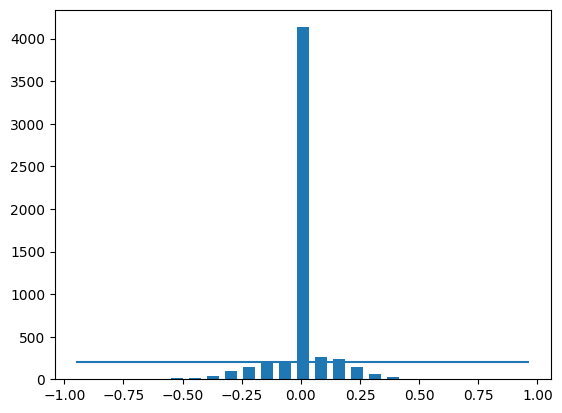

In [72]:
num_bins=25
samples_per_bin=200
hist,bins=np.histogram(data['steering'],num_bins)
center= (bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])), (samples_per_bin,samples_per_bin))

In [73]:
'''need to reject above a certain threshold all the 0 angles , so that bias to drive straight all the time reduces'''

'need to reject above a certain threshold all the 0 angles , so that bias to drive straight all the time reduces'

total data:  5608
removed 4036
remaining: 1572


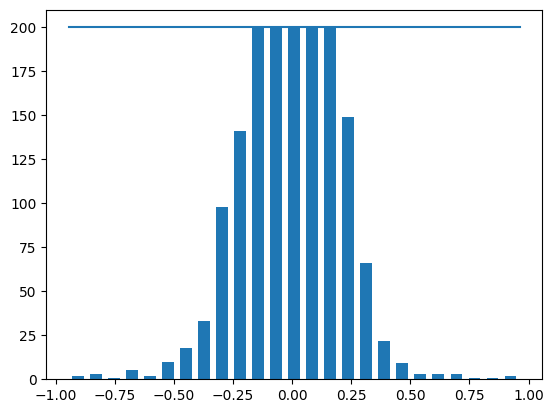

In [74]:
print('total data: ', len(data))
remove_list = []

for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i]>= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_= shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)
print('removed',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('remaining:',len(data))

hist, _ = np.histogram(data['steering'] , (num_bins))

plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])), (samples_per_bin,samples_per_bin))

In [75]:
print(data.iloc[1])

def load_img_steering(datadir , df):
    image_path=[]
    steering=[]
    for i in range(len(data)):
        indexed_data=data.iloc[i]
        center , left ,right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir , center.strip()))
        steering.append(float(indexed_data[3]))

    image_paths= np.asarray(image_path)
    steerings=np.asarray(steering)
    return image_paths, steerings

image_paths, steerings=load_img_steering(datadir + '/IMG', data)


X_train, X_valid , y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2 , random_state=6)

print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))





center      center_2024_09_14_17_44_24_941.jpg
left          left_2024_09_14_17_44_24_941.jpg
right        right_2024_09_14_17_44_24_941.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 0.000079
Name: 4, dtype: object


<ipython-input-75-c7d8e192d07e>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center , left ,right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-75-c7d8e192d07e>:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))


Training Samples: 1257
Valid Samples: 315


Text(0.5, 1.0, 'Validation set')

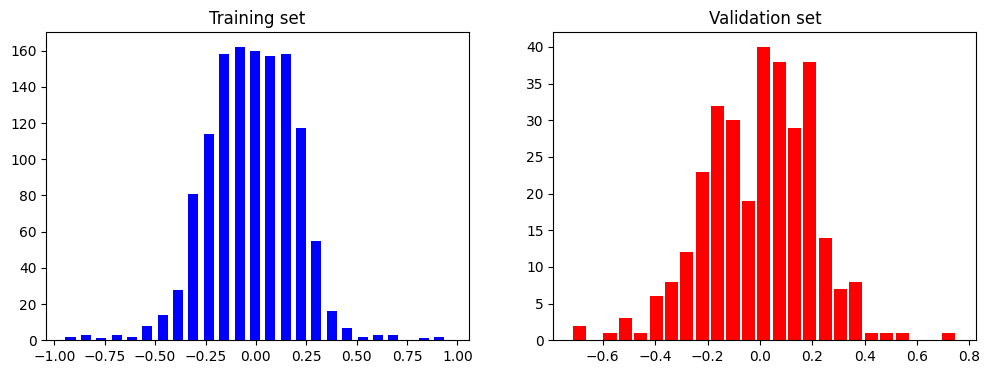

In [76]:
fig, axes=plt.subplots(1,2, figsize=(12,4))

axes[0].hist(y_train, bins= num_bins, width=0.05 , color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05 , color='red')
axes[1].set_title("Validation set")

In [77]:
#ZOOMING

def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))  # Zoom between 0% to 30%
    zoomed_image = zoom.augment_image(image)  # Apply zoom transformation
    return zoomed_image


Text(0.5, 1.0, 'Zoomed image')

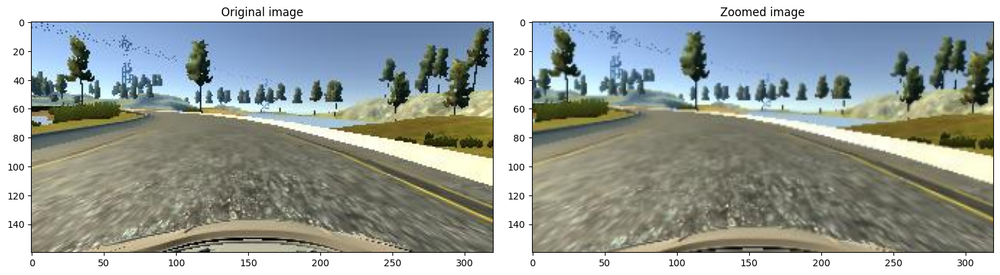

In [78]:
image = image_paths[random.randint(0,1000)]
original_image= mpimg.imread(image)
zoomed_image= zoom(original_image)

fig,axs=plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed image')

In [79]:
'''adding translations in image'''
def pan(image):
    pan = iaa.Affine(translate_percent = {'x':(-0.1,0.1), 'y' : (-0.1,0.1)})

    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned image')

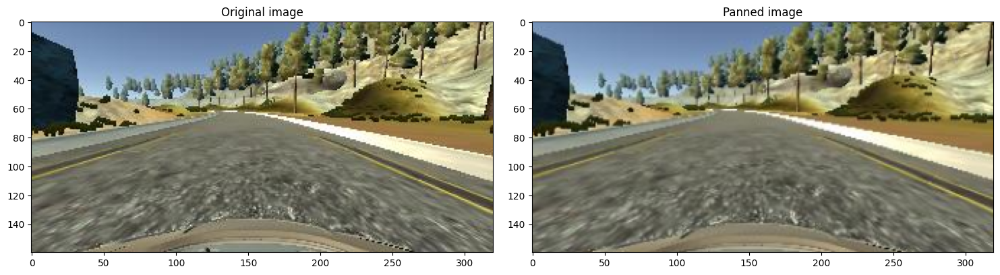

In [80]:
image = image_paths[random.randint(0,1000)]
original_image= mpimg.imread(image)
panned_image= zoom(original_image)

fig,axs=plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned image')

In [81]:
'''brightness alternation'''

def img_random_brightness(image):
    brightness= iaa.Multiply((0.2 , 1.2)) # multiples all the pixel intensities
    image=brightness.augment_image(image)

    return image

Text(0.5, 1.0, 'Brightnes altered image')

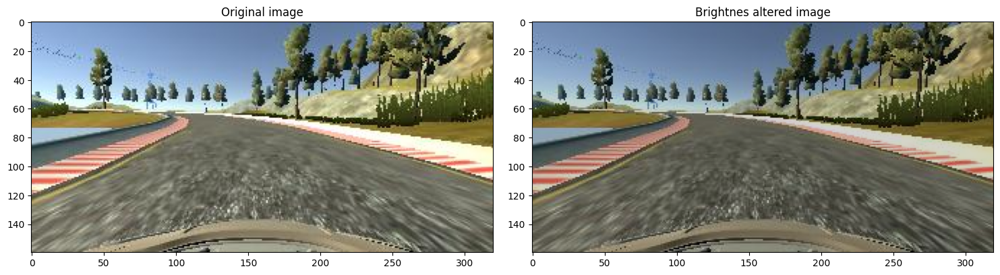

In [82]:
image = image_paths[random.randint(0,1000)]
original_image= mpimg.imread(image)
brightnes_altered_image= img_random_brightness(original_image)

fig,axs=plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original image')

axs[1].imshow(brightnes_altered_image)
axs[1].set_title('Brightnes altered image')

In [83]:
#Flipping to provide additional balancing

def img_random_flip(image, steering_angle):
    image=cv2.flip(image, 1) # 1 Horizontal flip , 0 vertical flip , -1 combination of horizontal and vertical flip
    steering_angle = -steering_angle
    return image , steering_angle

Text(0.5, 1.0, 'Flipped image- Steering Angle0.2034174')

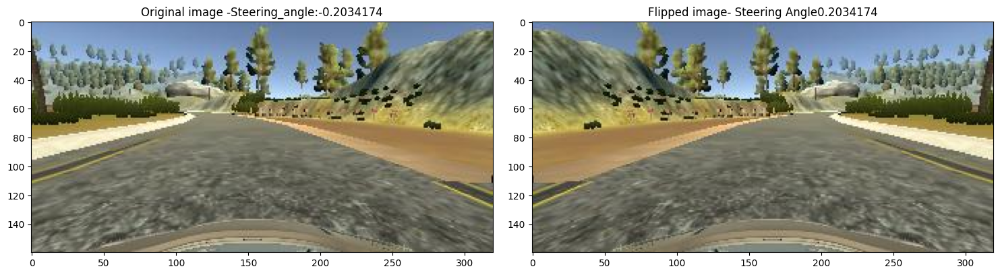

In [84]:
random_index = random.randint(0,1000)
image = image_paths[random_index]

steering_angle= steerings[random_index]

original_image= mpimg.imread(image)
flipped_image ,  flipped_steering_angle= img_random_flip(original_image , steering_angle)

fig,axs=plt.subplots(1,2, figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original image -' + 'Steering_angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped image- '+'Steering Angle'+ str(flipped_steering_angle))

In [85]:
def random_augment(image, steering_angle):
    image=mpimg.imread(image)
    if np.random.rand() <0.5:
        image=pan(image)
    if np.random.rand() <0.5:
        image=zoom(image)
    if np.random.rand() <0.5:
        image=img_random_brightness(image)
    if np.random.rand() <0.5:
        image ,steering_angle= img_random_flip(image,steering_angle)

    return image , steering_angle


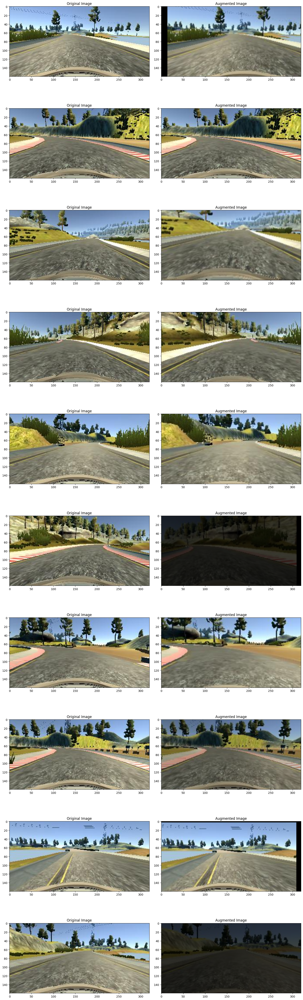

In [86]:
ncol = 2
nrow = 10

fig , axs = plt.subplots(nrow , ncol , figsize = (15,50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0,len(image_paths)-1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image , steering = random_augment(random_image , random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

In [87]:

def img_preprocess(img):

    img = img[60:135,:,:] # Cropping the image
    img= cv2.cvtColor(img,cv2.COLOR_RGB2YUV) #Y is luminosity , UV give color, this color is very effective for training model

    cv2.GaussianBlur(img,(3,3),0) #Reduce noise
    img=cv2.resize(img,(200,66))

    img = img/255 #Normalize
    return img



Text(0.5, 1.0, 'Preprocessed image')

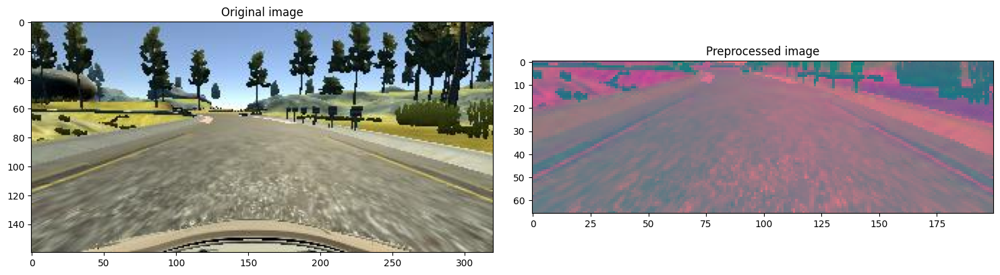

In [88]:
image = image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image= img_preprocess(original_image)

fig, axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed image')

In [89]:
def batch_generator(image_paths, steering_angle, batch_size, istraining):
    ''' Returns and saves all the initialized values inside the batch_generator. '''

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_angle[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_angle[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)

        yield (np.asarray(batch_img), np.asarray(batch_steering))


Text(0.5, 1.0, 'Validation Image')

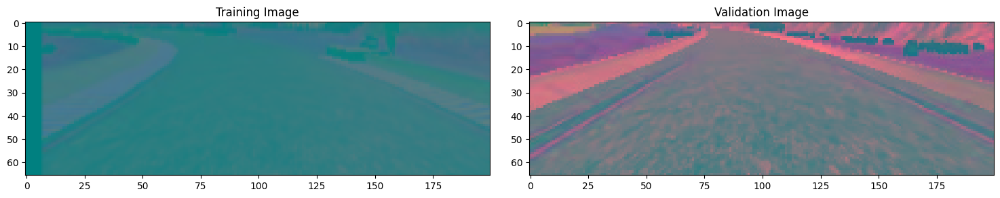

In [90]:
x_train_gen, y_train_gennext=next(batch_generator(X_train , y_train,1,1))
x_valid_gen, y_valid_gennext= next(batch_generator(X_valid , y_valid,1,0)) # 0 for false , validation data no need to augment

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [91]:
'''
X_train = np.array(list(map(img_preprocess, X_train)))
X_valid=np.array(list(map(img_preprocess, X_valid)))
'''



'\nX_train = np.array(list(map(img_preprocess, X_train)))\nX_valid=np.array(list(map(img_preprocess, X_valid)))\n'

In [92]:
'''plt.imshow(X_train[random.randint(0,len(X_train)-1)])
plt.axis("off")
print(X_train.shape)
'''

'plt.imshow(X_train[random.randint(0,len(X_train)-1)])\nplt.axis("off")\nprint(X_train.shape)\n'

In [93]:
def nvidia_model():
    model = Sequential()

    # Correct Conv2D layers with proper argument order
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))

    # model.add(Dropout(0.5))
    model.add(Flatten())

    model.add(Dense(100, activation='elu'))
    #model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu'))
    #model.add(Dropout(0.5))

    model.add(Dense(10, activation='elu'))
   # model.add(Dropout(0.5))

    model.add(Dense(1))  # Final output layer for regression (steering angle prediction)

    optimizer = Adam(learning_rate=1e-4)
    model.compile(loss='mse', optimizer=optimizer)

    return model

In [94]:
model=nvidia_model()
print(model.summary)

<bound method Model.summary of <Sequential name=sequential_2, built=True>>


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                      steps_per_epoch=300,
                                      epochs=10,
                                      validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                      validation_steps=200,
                                      verbose=1,
                                      shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 124s 401ms/step - loss: 0.0571 - val_loss: 0.0293
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 391ms/step - loss: 0.0349 - val_loss: 0.0249
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 118s 394ms/step - loss: 0.0315 - val_loss: 0.0262
Epoch 4/10
231/300 ━━━━━━━━━━━━━━━━━━━━ 19s 289ms/step - loss: 0.0301

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('Loss')
plt.xlabel('epoch')

In [ ]:
model.save('model.h5')

In [ ]:
from google.colab import files

files.download('model.h5')